In [33]:
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
from nltk.stem import SnowballStemmer
from nltk.tokenize import WordPunctTokenizer
from nltk.tokenize import RegexpTokenizer
from pymystem3 import Mystem
import pandas as pd
import matplotlib
import wordcloud
import spacy
from spacy import displacy

In [3]:
%pip install nltk spacy pymorphy2 pymorphy2-dicts pymystem3 pandas matplotlib wordcloud
%pip install spacy[ru] 


Note: you may need to restart the kernel to use updated packages.



In [ ]:
file_names = ['vij.txt', 'zapiski_symachedchego.txt', 'portret.txt', 'nos.txt', 'nevskiy_prospect.txt', 'starosvetskie_pomeshiki.txt']

texts = []

for file_name in file_names:
    with open(file_name, 'r', encoding='utf-8') as file:
        text = file.read()
        texts.append(text)

for i, text in enumerate(texts):
    print(f"Текст произведения {i + 1}:\n{text}\n")


Текст произведения 1:
Как только ударял в Киеве поутру довольно звонкий семинарский колокол, висевший у ворот Братского монастыря, то уже со всего города спешили толпами школьники и бурсаки. Грамматики, риторы, философы и богословы, с тетрадями под мышкой, брели в класс. Грамматики были еще очень малы; идя, толкали друг друга и бранились между собою самым тоненьким дискантом; они были все почти в изодранных или запачканных платьях, и карманы их вечно были наполнены всякою дрянью, как-то: бабками, свистелками, сделанными из перышек, недоеденным пирогом, а иногда даже и маленькими воробьенками, из которых один, вдруг чиликнув среди необыкновенной тишины в классе, доставлял своему патрону порядочные пали в обе руки, а иногда и вишневые розги. Риторы шли солиднее: платья у них были часто совершенно целы, но зато на лице всегда почти бывало какое-нибудь украшение в виде риторического тропа: или один глаз уходил под самый лоб, или вместо губы целый пузырь, или какая-нибудь другая примета; эт

In [ ]:
import nltk

file_names = ['vij.txt', 'zapiski_symachedchego.txt', 'portret.txt', 'nos.txt', 'nevskiy_prospect.txt', 'starosvetskie_pomeshiki.txt']

tokenized_texts = []

tokenizer = nltk.RegexpTokenizer(r'\w+')

for file_name in file_names:
    with open(file_name, 'r', encoding='utf-8') as file:
        text = file.read()
        tokens = tokenizer.tokenize(text)
        tokenized_texts.append(tokens)

for i, tokens in enumerate(tokenized_texts):
    print(f"Токенизированный текст произведения {i + 1}:\n{tokens}\n")


Токенизированный текст произведения 1:
['Как', 'только', 'ударял', 'в', 'Киеве', 'поутру', 'довольно', 'звонкий', 'семинарский', 'колокол', 'висевший', 'у', 'ворот', 'Братского', 'монастыря', 'то', 'уже', 'со', 'всего', 'города', 'спешили', 'толпами', 'школьники', 'и', 'бурсаки', 'Грамматики', 'риторы', 'философы', 'и', 'богословы', 'с', 'тетрадями', 'под', 'мышкой', 'брели', 'в', 'класс', 'Грамматики', 'были', 'еще', 'очень', 'малы', 'идя', 'толкали', 'друг', 'друга', 'и', 'бранились', 'между', 'собою', 'самым', 'тоненьким', 'дискантом', 'они', 'были', 'все', 'почти', 'в', 'изодранных', 'или', 'запачканных', 'платьях', 'и', 'карманы', 'их', 'вечно', 'были', 'наполнены', 'всякою', 'дрянью', 'как', 'то', 'бабками', 'свистелками', 'сделанными', 'из', 'перышек', 'недоеденным', 'пирогом', 'а', 'иногда', 'даже', 'и', 'маленькими', 'воробьенками', 'из', 'которых', 'один', 'вдруг', 'чиликнув', 'среди', 'необыкновенной', 'тишины', 'в', 'классе', 'доставлял', 'своему', 'патрону', 'порядочные', 

In [ ]:
import nltk

file_names = ['vij.txt', 'zapiski_symachedchego.txt', 'portret.txt', 'nos.txt', 'nevskiy_prospect.txt', 'starosvetskie_pomeshiki.txt']

tagged_texts = []

tokenizer = nltk.RegexpTokenizer(r'\w+')

for file_name in file_names:
    with open(file_name, 'r', encoding='utf-8') as file:
        text = file.read()
        tokens = tokenizer.tokenize(text)
        tagged = nltk.pos_tag(tokens)
        tagged_texts.append(tagged)

for i, tagged in enumerate(tagged_texts):
    print(f"Разбор по частям речи для произведения {i + 1}:\n{tagged}\n")


Разбор по частям речи для произведения 1:
[('Как', 'JJ'), ('только', 'NNP'), ('ударял', 'NNP'), ('в', 'NNP'), ('Киеве', 'NNP'), ('поутру', 'NNP'), ('довольно', 'NNP'), ('звонкий', 'NNP'), ('семинарский', 'NNP'), ('колокол', 'NNP'), ('висевший', 'NNP'), ('у', 'NNP'), ('ворот', 'NNP'), ('Братского', 'NNP'), ('монастыря', 'NNP'), ('то', 'NNP'), ('уже', 'NNP'), ('со', 'NNP'), ('всего', 'NNP'), ('города', 'NNP'), ('спешили', 'NNP'), ('толпами', 'NNP'), ('школьники', 'NNP'), ('и', 'NNP'), ('бурсаки', 'NNP'), ('Грамматики', 'NNP'), ('риторы', 'NNP'), ('философы', 'NNP'), ('и', 'NNP'), ('богословы', 'NNP'), ('с', 'NNP'), ('тетрадями', 'NNP'), ('под', 'NNP'), ('мышкой', 'NNP'), ('брели', 'NNP'), ('в', 'NNP'), ('класс', 'NNP'), ('Грамматики', 'NNP'), ('были', 'NNP'), ('еще', 'NNP'), ('очень', 'NNP'), ('малы', 'NNP'), ('идя', 'NNP'), ('толкали', 'NNP'), ('друг', 'NNP'), ('друга', 'NNP'), ('и', 'NNP'), ('бранились', 'NNP'), ('между', 'NNP'), ('собою', 'NNP'), ('самым', 'NNP'), ('тоненьким', 'NNP')

In [ ]:
import nltk
from nltk.stem import WordNetLemmatizer

file_names = ['vij.txt', 'zapiski_symachedchego.txt', 'portret.txt', 'nos.txt', 'nevskiy_prospect.txt', 'starosvetskie_pomeshiki.txt']

lemmatized_texts = []

tokenizer = nltk.RegexpTokenizer(r'\w+')
lemmatizer = WordNetLemmatizer()

for file_name in file_names:
    with open(file_name, 'r', encoding='utf-8') as file:
        text = file.read()
        tokens = tokenizer.tokenize(text)
        lemmatized = [lemmatizer.lemmatize(token) for token in tokens]
        lemmatized_texts.append(lemmatized)

for i, lemmatized in enumerate(lemmatized_texts):
    print(f"Лемматизированный текст произведения {i + 1}:\n{lemmatized}\n")


Лемматизированный текст произведения 1:
['Как', 'только', 'ударял', 'в', 'Киеве', 'поутру', 'довольно', 'звонкий', 'семинарский', 'колокол', 'висевший', 'у', 'ворот', 'Братского', 'монастыря', 'то', 'уже', 'со', 'всего', 'города', 'спешили', 'толпами', 'школьники', 'и', 'бурсаки', 'Грамматики', 'риторы', 'философы', 'и', 'богословы', 'с', 'тетрадями', 'под', 'мышкой', 'брели', 'в', 'класс', 'Грамматики', 'были', 'еще', 'очень', 'малы', 'идя', 'толкали', 'друг', 'друга', 'и', 'бранились', 'между', 'собою', 'самым', 'тоненьким', 'дискантом', 'они', 'были', 'все', 'почти', 'в', 'изодранных', 'или', 'запачканных', 'платьях', 'и', 'карманы', 'их', 'вечно', 'были', 'наполнены', 'всякою', 'дрянью', 'как', 'то', 'бабками', 'свистелками', 'сделанными', 'из', 'перышек', 'недоеденным', 'пирогом', 'а', 'иногда', 'даже', 'и', 'маленькими', 'воробьенками', 'из', 'которых', 'один', 'вдруг', 'чиликнув', 'среди', 'необыкновенной', 'тишины', 'в', 'классе', 'доставлял', 'своему', 'патрону', 'порядочные',

In [ ]:
import nltk
from nltk.stem import PorterStemmer

file_names = ['vij.txt', 'zapiski_symachedchego.txt', 'portret.txt', 'nos.txt', 'nevskiy_prospect.txt', 'starosvetskie_pomeshiki.txt']

stemmed_texts = []

tokenizer = nltk.RegexpTokenizer(r'\w+')
stemmer = PorterStemmer()

for file_name in file_names:
    with open(file_name, 'r', encoding='utf-8') as file:
        text = file.read()
        tokens = tokenizer.tokenize(text)
        stemmed = [stemmer.stem(token) for token in tokens]
        stemmed_texts.append(stemmed)

for i, stemmed in enumerate(stemmed_texts):
    print(f"Стеммированный текст произведения {i + 1}:\n{stemmed}\n")


Стеммированный текст произведения 1:
['как', 'только', 'ударял', 'в', 'киеве', 'поутру', 'довольно', 'звонкий', 'семинарский', 'колокол', 'висевший', 'у', 'ворот', 'братского', 'монастыря', 'то', 'уже', 'со', 'всего', 'города', 'спешили', 'толпами', 'школьники', 'и', 'бурсаки', 'грамматики', 'риторы', 'философы', 'и', 'богословы', 'с', 'тетрадями', 'под', 'мышкой', 'брели', 'в', 'класс', 'грамматики', 'были', 'еще', 'очень', 'малы', 'идя', 'толкали', 'друг', 'друга', 'и', 'бранились', 'между', 'собою', 'самым', 'тоненьким', 'дискантом', 'они', 'были', 'все', 'почти', 'в', 'изодранных', 'или', 'запачканных', 'платьях', 'и', 'карманы', 'их', 'вечно', 'были', 'наполнены', 'всякою', 'дрянью', 'как', 'то', 'бабками', 'свистелками', 'сделанными', 'из', 'перышек', 'недоеденным', 'пирогом', 'а', 'иногда', 'даже', 'и', 'маленькими', 'воробьенками', 'из', 'которых', 'один', 'вдруг', 'чиликнув', 'среди', 'необыкновенной', 'тишины', 'в', 'классе', 'доставлял', 'своему', 'патрону', 'порядочные', 'п

In [ ]:
SnowballStemmer(language="russian")

In [ ]:
from pymystem3 import Mystem

m = Mystem()

file_names = ['vij.txt', 'zapiski_symachedchego.txt', 'portret.txt', 'nos.txt', 'nevskiy_prospect.txt', 'starosvetskie_pomeshiki.txt']

morphed_texts = []

for file_name in file_names:
    with open(file_name, 'r', encoding='utf-8') as file:
        text = file.read()
        analysis = m.analyze(text)
        morphed_texts.append(analysis)

for i, analysis in enumerate(morphed_texts):
    print(f"Морфологический анализ текста произведения {i + 1}:\n{analysis}\n")


Installing mystem to C:\Users\user/.local/bin\mystem.exe from http://download.cdn.yandex.net/mystem/mystem-3.1-win-64bit.zip


Морфологический анализ текста произведения 1:
[{'analysis': [{'lex': 'как', 'wt': 0.6102574114, 'gr': 'CONJ='}], 'text': 'Как'}, {'text': ' '}, {'analysis': [{'lex': 'только', 'wt': 0.9073895266, 'gr': 'PART='}], 'text': 'только'}, {'text': ' '}, {'analysis': [{'lex': 'ударять', 'wt': 1, 'gr': 'V,пе=прош,ед,изъяв,муж,несов'}], 'text': 'ударял'}, {'text': ' '}, {'analysis': [{'lex': 'в', 'wt': 0.9999917878, 'gr': 'PR='}], 'text': 'в'}, {'text': ' '}, {'analysis': [{'lex': 'киев', 'wt': 1, 'gr': 'S,гео,муж,неод=пр,ед'}], 'text': 'Киеве'}, {'text': ' '}, {'analysis': [{'lex': 'поутру', 'wt': 1, 'gr': 'ADV='}], 'text': 'поутру'}, {'text': ' '}, {'analysis': [{'lex': 'довольно', 'wt': 0.9002595385, 'gr': 'ADV='}], 'text': 'довольно'}, {'text': ' '}, {'analysis': [{'lex': 'звонкий', 'wt': 1, 'gr': 'A=(вин,ед,полн,муж,неод|им,ед,полн,муж)'}], 'text': 'звонкий'}, {'text': ' '}, {'analysis': [{'lex': 'семинарский', 'wt': 1, 'gr': 'A=(вин,ед,полн,муж,неод|им,ед,полн,муж)'}], 'text': 'семинарский

In [2]:
import spacy
import re
from wordcloud import WordCloud
import matplotlib.pyplot as plt

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


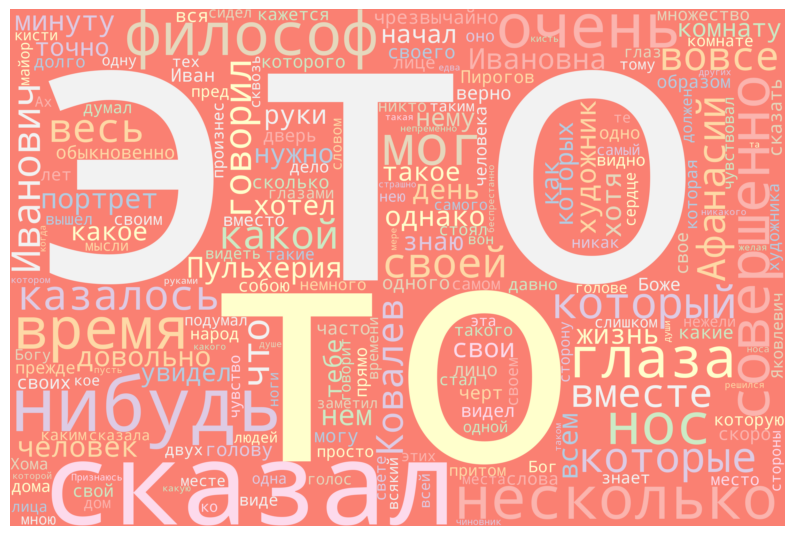

In [5]:
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt

nltk.download('stopwords')
stop_words = set(stopwords.words('russian'))

def remove_stopwords(text):
    words = nltk.word_tokenize(text)
    words = [word for word in words if word.lower() not in stop_words]
    filtered_text = ' '.join(words)
    return filtered_text

file_names = ['vij.txt', 'zapiski_symachedchego.txt', 'portret.txt', 'nos.txt', 'nevskiy_prospect.txt', 'starosvetskie_pomeshiki.txt']

all_text = ""
for file_name in file_names:
    with open(file_name, 'r', encoding='utf-8') as file:
        text = file.read()
    filtered_text = remove_stopwords(text)
    all_text += filtered_text

wordcloud = WordCloud(width=3000, height=2000, background_color='salmon', colormap='Pastel1', collocations=False).generate(all_text)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()
